In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from itertools import permutations, combinations

In [3]:
sns.set_style("darkgrid")

In [19]:
df = pd.read_csv('../dataset/clean/sample_sorted.csv', header=0)

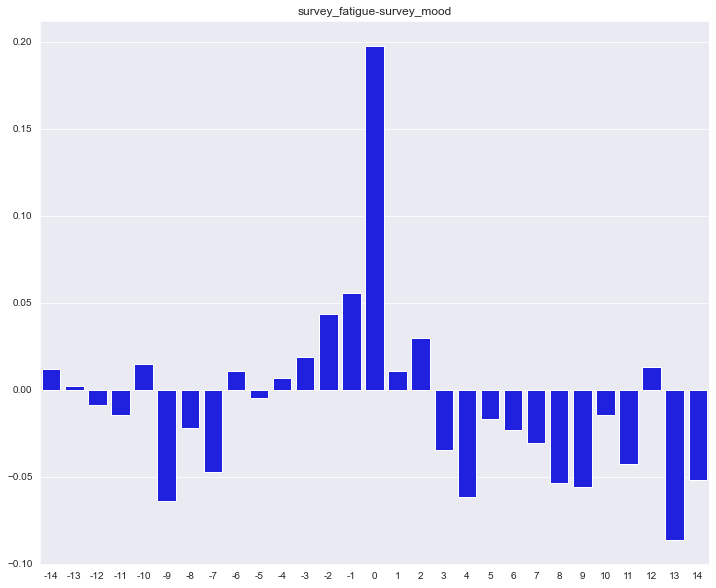

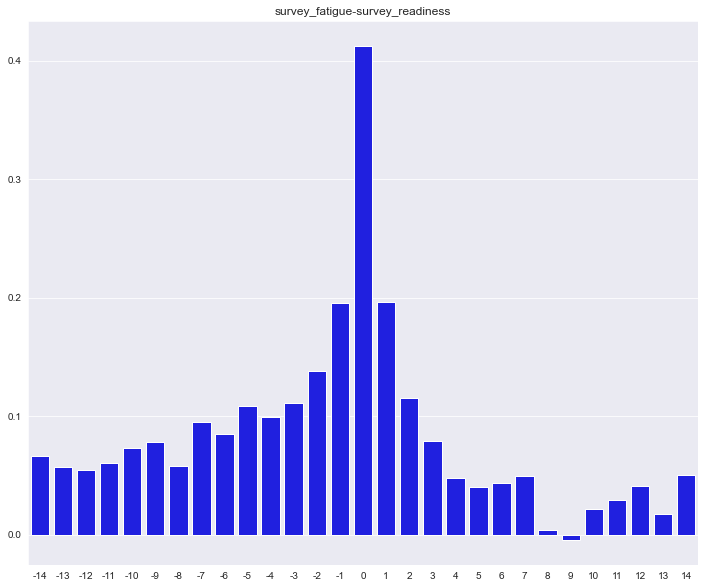

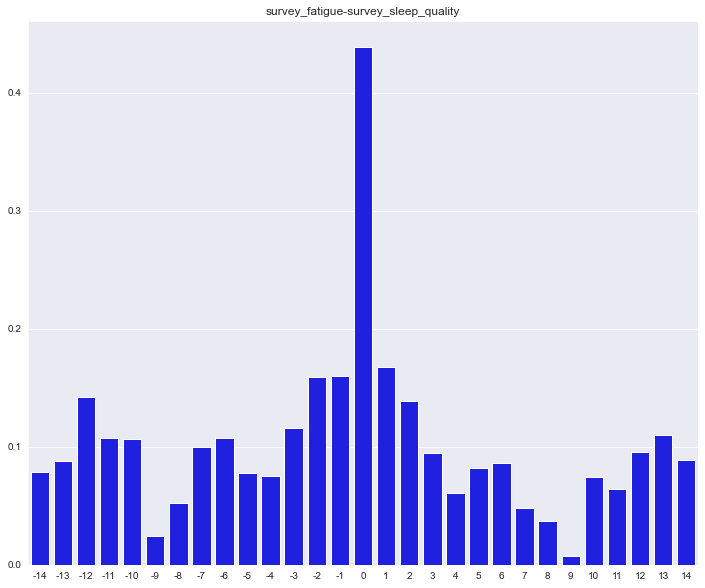

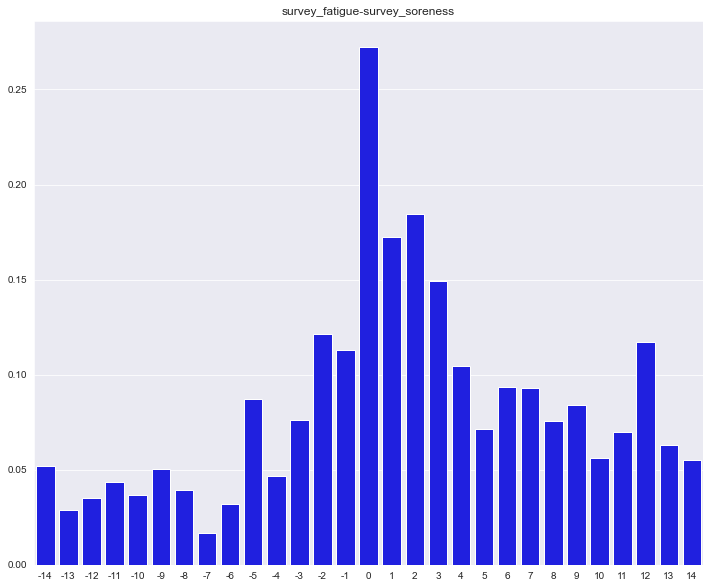

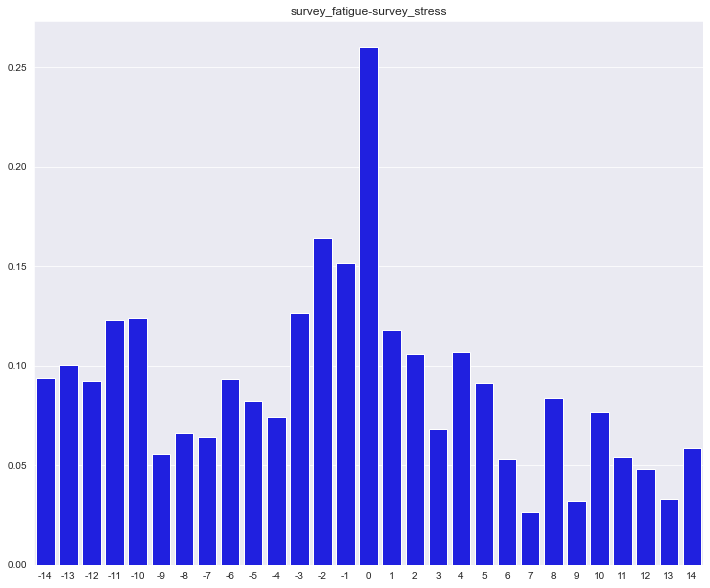

...

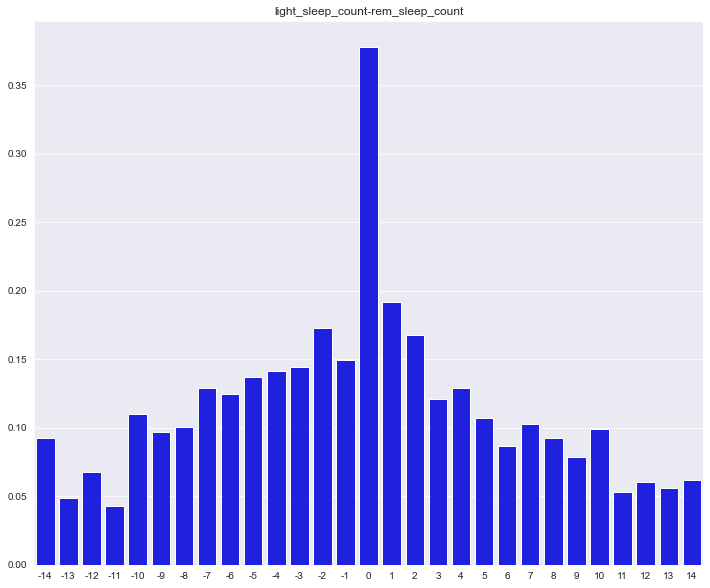

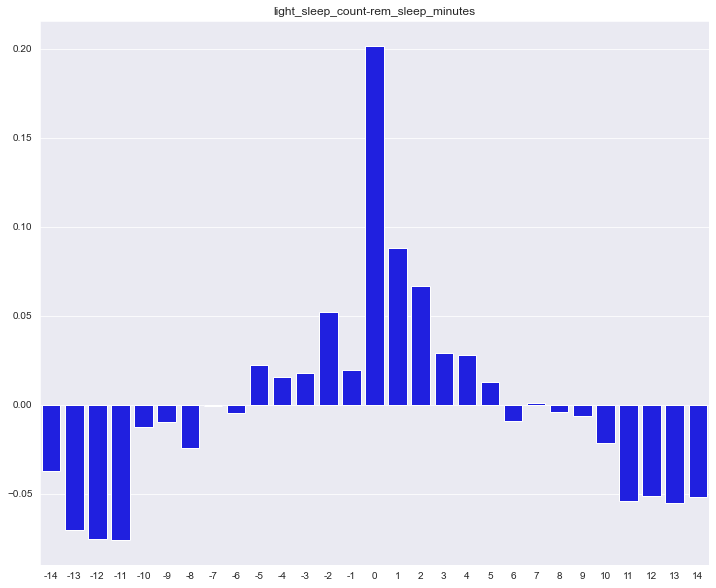

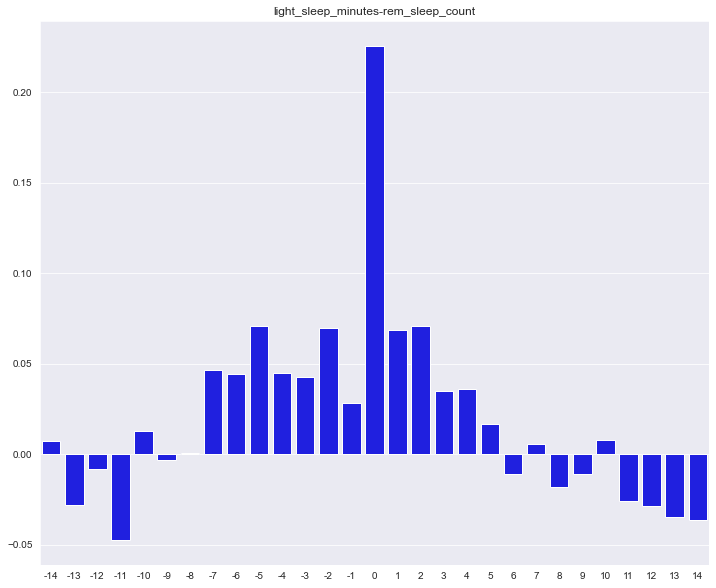

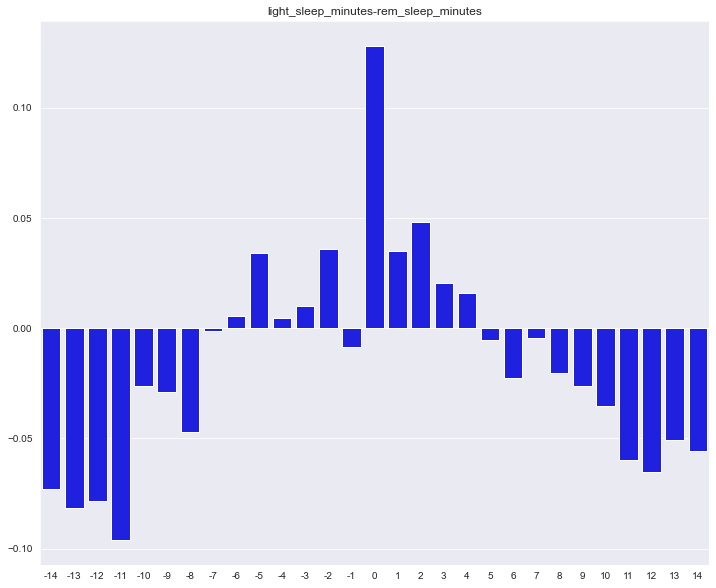

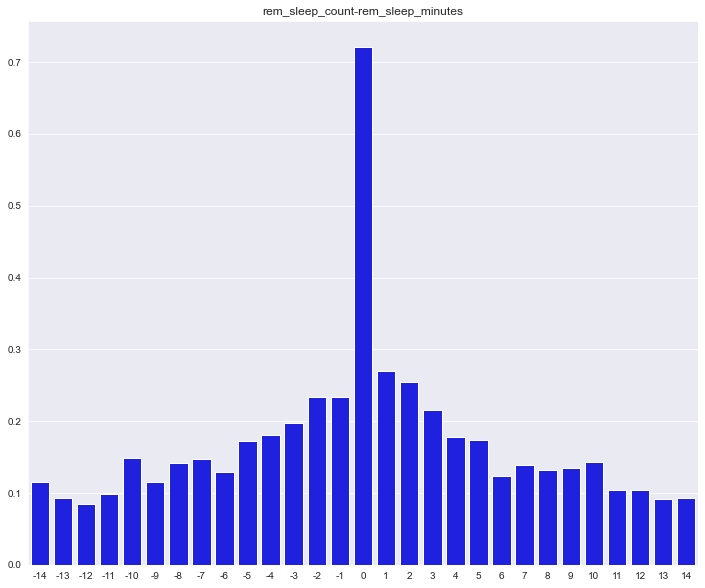

In [27]:
pairs = list(combinations(df.columns, 2))
upper = 14
corr_range = list(range(-upper,upper+1,1))

for x, y in pairs:
    if (df[x].dtype == object) or (df[y].dtype == object) or x == 'pid' or y == 'pid': continue
    pid_dfs = []
    shift_dfs = []
    for pid, pid_df in df.groupby('pid'):
        pid_dfs.append(pid_df.sort_values('date')[x])
        shift_dfs.append(pid_df.sort_values('date')[y])
    
    base_df = pd.concat(pid_dfs, axis=0, ignore_index=True)
    cors = []
    for i in corr_range:
        outer_df = pd.concat([s_df.shift(i) for s_df in shift_dfs], axis=0, ignore_index=True)
        cors.append(base_df.corr(outer_df))
    
    
    plt.figure(figsize=(12,10))
    sns.barplot(x=corr_range, y=cors, color='blue')
    plt.title(f'{x}-{y}')
    plt.show()
    plt.close()
    

        
#     cors = [pid_df[x].corr(pid_df[y].shift(i)) for i in corr_range]

#     sns.barplot(x=list(corr_range), y=cors, color="blue")
#     plt.title(f'Lead-lag Correlation of {x} by {y} for p{pid}')
#     plt.xlabel(f'Delay of {y} (Day)')
#     plt.ylabel('Correlation')
#     plt.axhline(0, color='black', linestyle='--', alpha=0.5)
#     #plt.xticks(range(0,upper,7))
#     #plt.show()

#     plt.savefig(os.path.join(f'p{pid}/', f'({x})-({y}).png'), bbox_inches='tight')
#     plt.clf()
#     plt.close()
    
                

In [29]:
for c in df.columns:
    if df[c].dtype == object or c == 'pid': continue
    
    autocors = []
    upper = 31
    for i in range(1,upper,1):
        source_dfs = []
        other_dfs = []
        for pid, pid_df in df[[c,'pid']].groupby('pid'):
            source_dfs.append(pid_df)
            other_dfs.append(pid_df.shift(i))

        source_df = pd.concat(source_dfs, axis=0, ignore_index=True)
        other_df = pd.concat(other_dfs, axis=0, ignore_index=True)
        autocors.append(source_df[c].corr(other_df[c]))
    
    plt.figure(figsize=(12,10))
    sns.barplot(x=list(range(1,upper,1)), y=autocors, color='blue')
    plt.title(f'Autocorrelation of {c}')
    plt.xlabel('Delay (Day)')
    plt.ylabel('Correlation')
    plt.axhline(0, color='black', linestyle='--', alpha=0.5)
    #plt.xticks(range(0,upper,7))
    #plt.show()
    
    plt.savefig(os.path.join(f'all/', f'{c}.png'), bbox_inches='tight')
    plt.clf()
    plt.close()